In [90]:
import ccxt
import calendar
from datetime import datetime, timedelta, date
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [91]:
 binance = ccxt.binance()

In [92]:
# assets = ["BTC/USDT","ETH/USDT","XRP/USDT","LINK/USDT","BCH/USDT","LTC/USDT","BNB/USDT","ADA/USDT"]
# assets = ["BTC/USDT","ETH/USDT","LTC/USDT","BNB/USDT","ADA/USDT", "LINK/USDT","BCH/USDT","DOT/USDT"]
assets = ["BTC/USDT","ETH/USDT","LTC/USDT","BNB/USDT","ADA/USDT"]

In [93]:
def Get_OHLCV(symbol):
    ohlcv = binance.fetchOHLCV(symbol,"1d",limit = 1000)
    
    df = pd.DataFrame(ohlcv, columns=["Date", "Open", "High", "Low", "Close", "Volume"])
    df["Date"] = [datetime.fromtimestamp(float(time) / 1000).strftime("%Y-%m-%d") for time in df["Date"]]
    df["Open"] = df["Open"].astype(np.float64)
    df["High"] = df["High"].astype(np.float64)
    df["Low"] = df["Low"].astype(np.float64)
    df["Close"] = df["Close"].astype(np.float64)
    df["Volume"] = df["Volume"].astype(np.float64)
    
    df.set_index(["Date"], inplace=True)
    
    return df

In [94]:
df = pd.DataFrame()
for symbol in assets:
    df[symbol] =  Get_OHLCV(symbol)['Close'] 

df

,BTC/USDT,ETH/USDT,LTC/USDT,BNB/USDT,ADA/USDT
Date,,,,,
2018-05-27,7338.99,570.40,117.71,12.6046,0.19186
2018-05-28,7099.00,511.50,110.82,11.9179,0.17249
2018-05-29,7461.29,567.36,119.28,12.6073,0.20164
2018-05-30,7375.96,557.19,117.18,12.6199,0.20779
2018-05-31,7485.01,577.81,118.25,14.2000,0.22330
...,...,...,...,...,...
2021-02-15,47911.10,1779.25,207.83,130.3030,0.86143
2021-02-16,49133.45,1781.99,210.26,130.1830,0.87000
2021-02-17,52119.71,1849.88,237.49,165.3233,0.89206


In [95]:
# calculate daily and annual returns of the stocks
returns_daily = df.pct_change()
returns_annual = returns_daily.mean() * 365

# get daily and covariance of returns of the stock
cov_daily = returns_daily.cov()
cov_annual = cov_daily * 365

In [96]:
# empty lists to store returns, volatility and weights of imiginary portfolios
port_returns = []
port_volatility = []
sharpe_ratio = []
stock_weights = []

In [97]:
# set the number of combinations for imaginary portfolios
num_assets = len(assets)
num_portfolios = 50000

In [98]:
# populate the empty lists with each portfolios returns,risk and weights
for single_portfolio in range(num_portfolios):
    weights = np.random.random(num_assets)
    weights /= np.sum(weights)
    returns = np.dot(weights, returns_annual)
    volatility = np.sqrt(np.dot(weights.T, np.dot(cov_annual, weights)))
    sharpe = returns / volatility
    sharpe_ratio.append(sharpe)
    port_returns.append(returns)
    port_volatility.append(volatility)
    stock_weights.append(weights)

# a dictionary for Returns and Risk values of each portfolio
portfolio = {'Returns': port_returns,
             'Volatility': port_volatility,
             'Sharpe Ratio': sharpe_ratio}


In [99]:
# extend original dictionary to accomodate each ticker and weight in the portfolio
for counter,symbol in enumerate(cov_annual.columns):
    portfolio[symbol+' Weight'] = [Weight[counter] for Weight in stock_weights]

# make a nice dataframe of the extended dictionary
rdf = pd.DataFrame(portfolio)

# get better labels for desired arrangement of columns
column_order = ['Returns', 'Volatility', 'Sharpe Ratio'] + [stock+' Weight' for stock in assets]

# reorder dataframe columns
rdf = rdf[column_order]

In [100]:
rdf

,Returns,Volatility,Sharpe Ratio,BTC/USDT Weight,ETH/USDT Weight,LTC/USDT Weight,BNB/USDT Weight,ADA/USDT Weight
0,0.922982,0.891886,1.034865,0.077614,0.370544,0.419664,0.084785,0.047393
1,0.932198,0.841207,1.108166,0.277352,0.341923,0.290732,0.043930,0.046064
2,1.129334,0.838024,1.347615,0.227009,0.125971,0.186587,0.240211,0.220222
3,0.978424,0.888822,1.100810,0.162541,0.245856,0.279040,0.024401,0.288162
4,1.045341,0.828351,1.261955,0.231582,0.234225,0.288667,0.222042,0.023484
...,...,...,...,...,...,...,...,...
49995,1.032292,0.821467,1.256645,0.306758,0.261907,0.178071,0.124304,0.128960
49996,0.961882,0.860710,1.117544,0.260256,0.217374,0.274846,0.008352,0.239173
49997,1.209311,0.826474,1.463217,0.261766,0.197282,0.022201,0.317389,0.201363
49998,1.079384,0.836381,1.290540,0.305766,0.269622,0.053642,0.106793,0.264176


In [101]:
rdf.loc[rdf['Sharpe Ratio'].idxmax()]

Returns            1.328495
Volatility         0.799316
Sharpe Ratio       1.662040
BTC/USDT Weight    0.409270
ETH/USDT Weight    0.014093
LTC/USDT Weight    0.001305
BNB/USDT Weight    0.533241
ADA/USDT Weight    0.042091
Name: 45780, dtype: float64

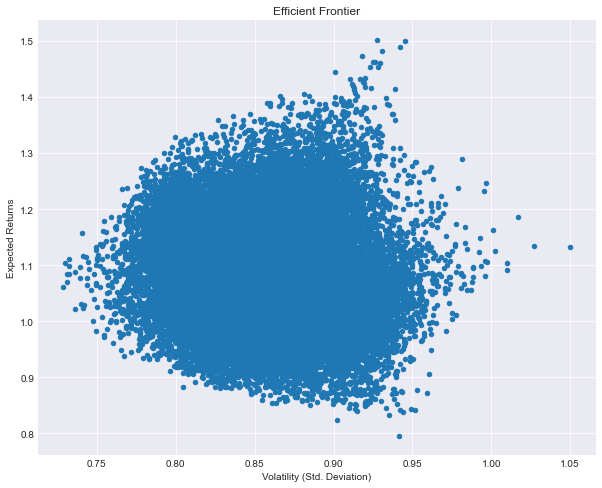

In [102]:
# plot frontier, max sharpe & min Volatility values with a scatterplot
plt.style.use('seaborn-dark')
rdf.plot.scatter(x='Volatility', y='Returns', figsize=(10, 8), grid=True)
plt.xlabel('Volatility (Std. Deviation)')
plt.ylabel('Expected Returns')
plt.title('Efficient Frontier')
plt.show()

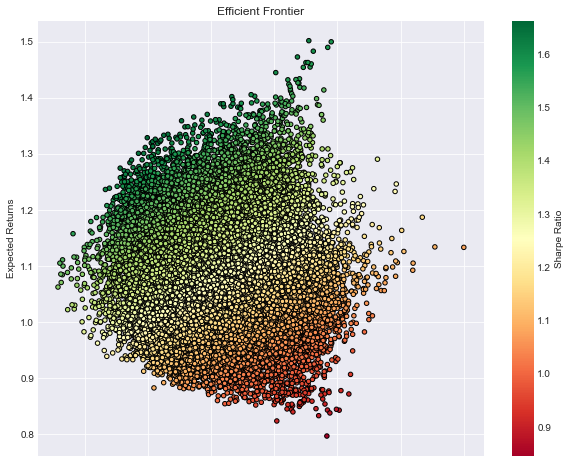

In [103]:
# plot frontier, max sharpe & min Volatility values with a scatterplot
plt.style.use('seaborn-dark')
rdf.plot.scatter(x='Volatility', y='Returns', c='Sharpe Ratio',
                cmap='RdYlGn', edgecolors='black', figsize=(10, 8), grid=True)
plt.xlabel('Volatility (Std. Deviation)')
plt.ylabel('Expected Returns')
plt.title('Efficient Frontier')
plt.show()